# Triple Scoring Function - DisMult & MRR

In [3]:
# DONE Email Xander to move meeting
# DONE Double check code 
    # DONE check edge_index --> correct index for transactions?
    # DONE Check embeddings 
    # DONE Manipulate Timestamp feature for edges 
# DONE DisMult 
# DONE Ranking via MRR

# TODO register account for DAS5

# TODO check theoretical concepts --> DisMult, MRR, idea of mini batches, optimization and loss calculations 
# TODO Review Code --> Diminishing Training effectiveness --> architecture correct? --> multiplication of embeddings & score between 0 and 1 CORRECT? 
# TODO improvements 
    # TODO normalize edge features (timestamp) and currency
    # TODO mini batches 

In [4]:
import pickle
import gzip
import torch
import torch.nn as nn
import torch.optim as optim

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


![Screenshot 2024-05-23 at 21.28.02.png](<attachment:Screenshot 2024-05-23 at 21.28.02.png>)
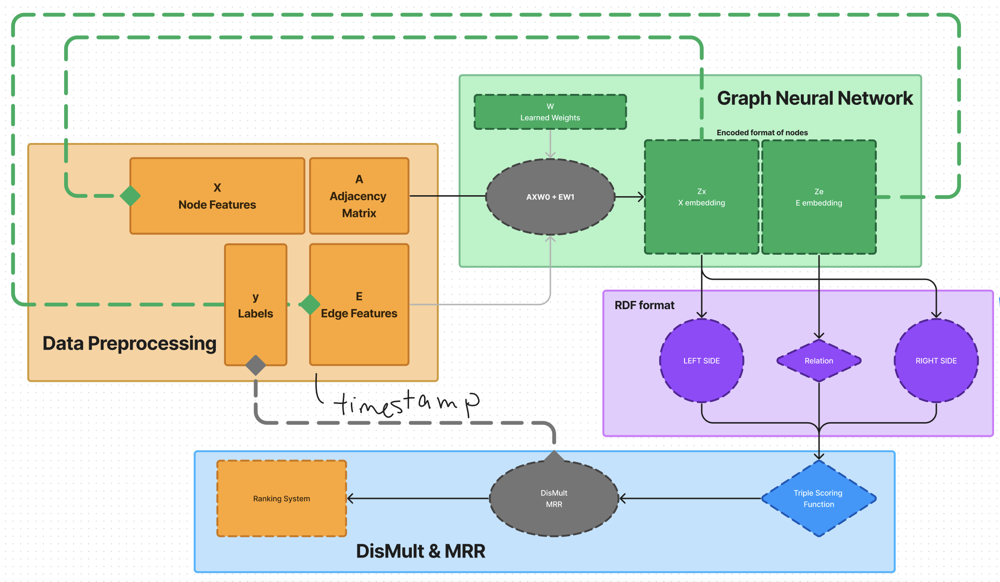

## Load data

In [5]:
with open("graph.pickle", "rb") as f:
    loaded_data = pickle.load(f)

labels = loaded_data["labels"]

In [6]:
def print_rdf_triples(file_path):
    with gzip.open(file_path, 'rt') as f:
        for line in f:
            print(line.strip())

# Replace 'embeddings.nt.gz' with the actual file path
print_rdf_triples("embeddings.nt.gz")

<http://example.org/node/0> <http://example.org/ontology#connectedTo> <http://example.org/node/0>
<http://example.org/node/0> <http://example.org/ontology#hasEmbedding> "-0.0041899635 -0.02927397 0.019502103 0.0029795368 0.04887036 0.00087385706 0.06722141 -0.016970158 0.0051050386 0.015823327 -0.012646257 0.01943206 0.011188019 -0.02629507 -0.020596633"
<http://example.org/node/0> <http://example.org/ontology#hasEmbedding> "-0.0041899635 -0.02927397 0.019502103 0.0029795368 0.04887036 0.00087385706 0.06722141 -0.016970158 0.0051050386 0.015823327 -0.012646257 0.01943206 0.011188019 -0.02629507 -0.020596633"
<http://example.org/relation/0> <http://example.org/ontology#hasEmbedding> "-33.369724 -10.805187 36.64892 -12.018215 14.795275 -32.9601 10.405438 33.46307 -38.556625 19.686995 25.487383 9.186537 -29.817432 -27.422358 -22.540808"
<http://example.org/node/1> <http://example.org/ontology#connectedTo> <http://example.org/node/8136>
<http://example.org/node/1> <http://example.org/ontol

In [7]:
def process_rdf(file_path):
    edges = []
    embeddings = []
    node_set = set()
    relation_set = set()

    with gzip.open(file_path, 'rt') as f:
        new_list = []
        counter = 0
        for line in f:
            if 'connectedTo' in line:  # edge
                edges.append(line.strip())
                parts = line.strip().split()
                head = parts[0].strip('<>').split('/')[-1]
                tail = parts[2].strip('<>').split('/')[-1]

                node_set.add(head)
                node_set.add(tail)
            elif 'hasEmbedding' in line:  # embeddings
                node_embedding = [float(val) for val in line.split('"')[1].split()]
                # node_embedding = torch.tensor(node_embedding)
                new_list.append(node_embedding)
                counter += 1
                if counter == 3:
                    embeddings.append(new_list)
                    new_list = []
                    counter = 0
    return edges, embeddings, node_set

# Test the function
edges, embeddings, node_set = process_rdf("embeddings.nt.gz")

# Prepare data for training
heads = []
relations = []
tails = []

for i in range(len(embeddings)):
    head = embeddings[i][0]
    tail = embeddings[i][1]
    relation = embeddings[i][2]
    
    heads.append(head)
    tails.append(tail)
    relations.append(relation)

# Stack the tensors for batch processing
heads = torch.tensor(heads, dtype=torch.float32, requires_grad=True)
relations = torch.tensor(relations, dtype=torch.float32, requires_grad=True)
tails = torch.tensor(tails, dtype=torch.float32, requires_grad=True)

print(heads.size())
print(tails.size())
print(relations.size())

# Get the number of nodes and relations from the data
num_nodes = len(node_set)
num_relations = len(embeddings)
embedding_dim = heads[0].size(0)  # Dimensionality of embeddings

print(num_nodes)
print(num_relations)
print(embedding_dim)


torch.Size([10000, 15])
torch.Size([10000, 15])
torch.Size([10000, 15])
15899
10000
15


In [19]:
class Dismult(nn.Module):
    def __init__(self, embedding_size):
        super(Dismult, self).__init__()
        self.embedding_size = embedding_size
        self.linear = nn.Linear(embedding_size * 3, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, head, relation, tail):
        combined = torch.cat((head, relation, tail), dim=1)
        out = self.linear(combined)
        score = self.sigmoid(out)
        return score

def calculate_mrr(ranks):
    reciprocal_ranks = 1.0 / ranks
    return torch.mean(reciprocal_ranks)

# Instantiate model
model = Dismult(embedding_size=15)

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10000
for epoch in range(num_epochs):
    optimizer.zero_grad()
    scores = model(heads, relations, tails)

    # print(scores.size())
    # print(scores.squeeze().size())

    loss = criterion(scores.squeeze(), labels)
    loss.backward()
    optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# After training, you can use the model to make predictions


Epoch [1/10000], Loss: 0.7100319862365723
Epoch [2/10000], Loss: 0.7097859382629395
Epoch [3/10000], Loss: 0.709488570690155
Epoch [4/10000], Loss: 0.7093991637229919
Epoch [5/10000], Loss: 0.7094045877456665
Epoch [6/10000], Loss: 0.7093499302864075
Epoch [7/10000], Loss: 0.7092369198799133
Epoch [8/10000], Loss: 0.7091479301452637
Epoch [9/10000], Loss: 0.7090882062911987
Epoch [10/10000], Loss: 0.7089836001396179
Epoch [11/10000], Loss: 0.7088032960891724
Epoch [12/10000], Loss: 0.7086025476455688
Epoch [13/10000], Loss: 0.7083901166915894
Epoch [14/10000], Loss: 0.7081397175788879
Epoch [15/10000], Loss: 0.7079542279243469
Epoch [16/10000], Loss: 0.7078161239624023
Epoch [17/10000], Loss: 0.7076782584190369
Epoch [18/10000], Loss: 0.7075610756874084
Epoch [19/10000], Loss: 0.7075170874595642
Epoch [20/10000], Loss: 0.70747971534729
Epoch [21/10000], Loss: 0.7073920965194702
Epoch [22/10000], Loss: 0.7071924209594727
Epoch [23/10000], Loss: 0.7071190476417542
Epoch [24/10000], Loss:

In [20]:
with torch.no_grad():
    scores = model(heads, relations, tails).squeeze()
    sorted_indices = torch.argsort(scores, descending=True)
    true_indices = sorted_indices[:torch.sum(labels).int()]  # Select top predictions based on number of positive labels
    mrr = 0
    for i, idx in enumerate(true_indices):
        if labels[idx].item() == 1:
            mrr = 1 / (i + 1)  # MRR calculation
            break
    print("Mean Reciprocal Rank (MRR):", mrr)


Mean Reciprocal Rank (MRR): 0.029411764705882353


In [21]:
print("Sorted Indices:", sorted_indices)
print("True Indices:", true_indices)

Sorted Indices: tensor([2521, 4543, 5140,  ..., 9997, 9998, 9999])
True Indices: tensor([2521, 4543, 5140,  ..., 2997, 2998, 2999])


In [22]:
with torch.no_grad():
    scores = model(heads, relations, tails).squeeze()
    sorted_indices = torch.argsort(scores, descending=True)
    true_indices = sorted_indices[:50]  # Select top 5 predictions
    mrr = 0
    for i, idx in enumerate(true_indices):
        if labels[idx].item() == 1:
            mrr = 1 / (i + 1)  # MRR calculation
            break
    print("Mean Reciprocal Rank (MRR):", mrr)


Mean Reciprocal Rank (MRR): 0.029411764705882353


In [23]:
true_indices

tensor([2521, 4543, 5140, 3379, 1939, 2212, 1141, 5459, 6106,  699, 1459, 1611,
        6296, 9793, 1088, 1637, 5081, 3006,  289, 9697, 2300, 4718, 8807, 8583,
        6912, 1516, 7361, 3202, 9923, 3615, 1592, 5066, 4459, 8901, 3723, 4097,
        1778, 9732, 3127, 4676, 4473, 5213,  269, 3390, 2636,  542, 7268, 1904,
        7651, 5086])

In [17]:
torch.nonzero(labels == 1).squeeze()

tensor([   1,    6,    7,  ..., 9994, 9995, 9998])